### LSE Data Analytics Online Career Accelerator

# DA201: Data Analytics using Python

## Assignment template: COVID-19 data

## Student Note
This template can be used to better understand the suggested assignment workflow and how to approach the questions. You are welcome to add code and Markdown blocks to the various sections to add either code or comments. Make sure to add code cells as applicable, and to comment all your code blocks.

You have the option to populate your Notebook with all the elements typically contained within the report, or to submit a separate report. In the case of submitting your Notebook, you can embed images, links and text where appropriate in addition to the text notes added.

**SPECIAL NOTE**
- Submit your Jupyter Notebook with the following naming convention: `LSE_DA201_assignment_[your name]_[your surname]` (remove the square brackets).
- You should submit a zipped folder containing all the elements used in your Notebook (data files, images, etc.).

> ***Markdown notes:*** Remember to change cell types to `Markdown`. You can review [Markdown basics](https://docs.github.com/en/get-started/writing-on-github/getting-started-with-writing-and-formatting-on-github/basic-writing-and-formatting-syntax) to find out how to add formatted text, links and images to your Markdown documents.

## 0) Environment preparation
These settings are provided for you. You do not need to make any changes.

In [6]:
# Import the required libraries and set the plotting options
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc = {'figure.figsize':(15,10)})

### Required: Report submission:
Insert URL (to your public GitHub repository) and a screenshot - double click cell to edit
- [My Github Repo](https://github.com/username/reponame)
- Screenshot demo (replace with your own).

!['My Github screenshot](http://github.com/apvoges/lse-ca/blob/main/GitHubScreenshot.png?raw=true)
(Note that this only works if your repo is set to **public**. Alternatively you need to refer to a local image and include this image in your submission.)

### 1.2) Presentation expectations:
- Describe the role and how workflow tools such as GitHub can be used to add value to organisations.

### Optional for notebook/Required for presentation.
- You can use this cell as placeholder for bullet points to include in your presentation. 
- This section will not be graded in the Notebook, grades awarded based on presentation content only. 

(Double-click to edit)

## 2) Assignment activity 2: 

### 2.1) Report expectations:
- Load the files `covid_19_uk_cases.csv` and `covid_19_uk_vaccinated.csv` and explore the data.
- Explore the data using the `info()`, `describe()`, `shape` and `value_counts()` methods, and note the observations regarding data types, number or records and features.
- Identify missing data.
- Filter/subset data.
- Aggregate data (totals and by month).
- Note observations.

In [7]:
# Load the COVID-19 cases and vaccine data sets as cov and vac respectively
covid_19_uk_cases = pd.read_csv('covid_19_uk_cases.csv')
covid_19_uk_vaccinated = pd.read_csv('covid_19_uk_vaccinated.csv')
tweets = pd.read_csv('tweets.csv')

In [8]:
cov = covid_19_uk_cases
vac = covid_19_uk_vaccinated

In [9]:
# Explore the DataFrames with the appropriate functions
cov.head()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,0.0,0.0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,0.0,0.0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,0.0,0.0


In [10]:
cov.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7584 entries, 0 to 7583
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   object 
 6   Intermediate Region Code  7584 non-null   int64  
 7   Date                      7584 non-null   object 
 8   Deaths                    7582 non-null   float64
 9   Cases                     7582 non-null   float64
 10  Recovered                 7582 non-null   float64
 11  Hospitalised              7582 non-null   float64
dtypes: float64(6), int64(1), object(5)
memory usage: 711.1+ KB


In [11]:
cov.tail()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
7579,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-10,137735.0,8154306.0,0.0,378.0
7580,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-11,137763.0,8193769.0,0.0,386.0
7581,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-12,137944.0,8231437.0,0.0,386.0
7582,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-13,138080.0,8272883.0,0.0,0.0
7583,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-14,138237.0,8317439.0,0.0,0.0


In [12]:
cov.isnull().sum()

Province/State              0
Country/Region              0
Lat                         0
Long                        0
ISO 3166-1 Alpha 3-Codes    0
Sub-region Name             0
Intermediate Region Code    0
Date                        0
Deaths                      2
Cases                       2
Recovered                   2
Hospitalised                2
dtype: int64

In [13]:
vac.head()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0,0,0


In [14]:
vac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7584 entries, 0 to 7583
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   object 
 6   Intermediate Region Code  7584 non-null   int64  
 7   Date                      7584 non-null   object 
 8   Vaccinated                7584 non-null   int64  
 9   First Dose                7584 non-null   int64  
 10  Second Dose               7584 non-null   int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 651.9+ KB


In [15]:
vac.tail()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
7579,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-10,1070,1216,1070
7580,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-11,1300,1604,1300
7581,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-12,1482,2027,1482
7582,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-13,0,0,0
7583,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-14,0,0,0


In [16]:
vac.isnull().sum()

Province/State              0
Country/Region              0
Lat                         0
Long                        0
ISO 3166-1 Alpha 3-Codes    0
Sub-region Name             0
Intermediate Region Code    0
Date                        0
Vaccinated                  0
First Dose                  0
Second Dose                 0
dtype: int64

In [17]:
# Create DataFrame based on Gibraltar data
# Hint: newdf = df[df[col]==index]
gibraltar = cov[covid_19_uk_cases['Province/State'] == 'Gibraltar']
gibraltar

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0.0,0.0,0.0,0.0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0.0,0.0,0.0,0.0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0.0,0.0,0.0,0.0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0.0,0.0,0.0,0.0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4419,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-10,97.0,5626.0,0.0,858.0
4420,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-11,97.0,5655.0,0.0,876.0
4421,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-12,97.0,5682.0,0.0,876.0
4422,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2021-10-13,97.0,5707.0,0.0,0.0


In [18]:
# print the whole DataFrame
# replace df with the name you have given your DataFrame
pd.set_option("display.max_rows", None)
gibraltar

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0.0,0.0,0.0,0.0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0.0,0.0,0.0,0.0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0.0,0.0,0.0,0.0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0.0,0.0,0.0,0.0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0.0,0.0,0.0,0.0
3797,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-27,0.0,0.0,0.0,0.0
3798,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-28,0.0,0.0,0.0,0.0
3799,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-29,0.0,0.0,0.0,0.0
3800,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-30,0.0,0.0,0.0,0.0
3801,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-31,0.0,0.0,0.0,0.0


In [19]:
#subset the data for deaths, cases, recovered, hospitalised
gibraltar_subset = gibraltar [['Deaths','Cases','Recovered','Hospitalised']]
gibraltar_subset

,Deaths,Cases,Recovered,Hospitalised
3792,0.0,0.0,0.0,0.0
3793,0.0,0.0,0.0,0.0
3794,0.0,0.0,0.0,0.0
3795,0.0,0.0,0.0,0.0
3796,0.0,0.0,0.0,0.0
3797,0.0,0.0,0.0,0.0
3798,0.0,0.0,0.0,0.0
3799,0.0,0.0,0.0,0.0
3800,0.0,0.0,0.0,0.0
3801,0.0,0.0,0.0,0.0


In [20]:
gibraltar_subset.describe()

,Deaths,Cases,Recovered,Hospitalised
count,632.000000,632.000000,632.000000,632.000000
mean,40.208861,2237.109177,1512.821203,1027.625000
std,45.332832,2136.268090,1817.096755,1145.681058
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,177.000000,109.500000,157.750000
50%,5.000000,1036.500000,323.500000,675.500000
75%,94.000000,4286.000000,4122.500000,1548.000000
max,97.000000,5727.000000,4670.000000,4907.000000


In [25]:
# Join the DataFrames as covid where you merge cov and vac
cov_vac = pd.merge(cov, vac,
                   on=['Date','Province/State'], how='left')

In [26]:
cov_vac.reset_index()

,index,Province/State,Country/Region_x,Lat_x,Long_x,ISO 3166-1 Alpha 3-Codes_x,Sub-region Name_x,Intermediate Region Code_x,Date,Deaths,...,Hospitalised,Country/Region_y,Lat_y,Long_y,ISO 3166-1 Alpha 3-Codes_y,Sub-region Name_y,Intermediate Region Code_y,Vaccinated,First Dose,Second Dose
0,0,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
1,1,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
2,2,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
3,3,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
4,4,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
5,5,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-27,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
6,6,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-28,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
7,7,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-29,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
8,8,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-30,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
9,9,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-31,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0


In [23]:
# Explore the new DataFrame
cov_vac.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7584 entries, 0 to 7583
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Province/State              7584 non-null   object 
 1   Country/Region_x            7584 non-null   object 
 2   Lat_x                       7584 non-null   float64
 3   Long_x                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes_x  7584 non-null   object 
 5   Sub-region Name_x           7584 non-null   object 
 6   Intermediate Region Code_x  7584 non-null   int64  
 7   Date                        7584 non-null   object 
 8   Deaths                      7582 non-null   float64
 9   Cases                       7582 non-null   float64
 10  Recovered                   7582 non-null   float64
 11  Hospitalised                7582 non-null   float64
 12  Country/Region_y            7584 non-null   object 
 13  Lat_y                       7584 

In [28]:
# Fix the date column data type
cov_vac['Date'] = pd.to_datetime(cov_vac['Date'])
cov_vac.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 7584 entries, 0 to 7583
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Province/State              7584 non-null   object        
 1   Country/Region_x            7584 non-null   object        
 2   Lat_x                       7584 non-null   float64       
 3   Long_x                      7584 non-null   float64       
 4   ISO 3166-1 Alpha 3-Codes_x  7584 non-null   object        
 5   Sub-region Name_x           7584 non-null   object        
 6   Intermediate Region Code_x  7584 non-null   int64         
 7   Date                        7584 non-null   datetime64[ns]
 8   Deaths                      7582 non-null   float64       
 9   Cases                       7582 non-null   float64       
 10  Recovered                   7582 non-null   float64       
 11  Hospitalised                7582 non-null   float64     

In [29]:
cov_vac_subset = cov_vac[['Province/State','Date','Deaths','Cases','Recovered','Hospitalised','Vaccinated','First Dose','Second Dose']]
cov_vac_subset.head()

,Province/State,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose
0,Anguilla,2020-01-22,0.0,0.0,0.0,0.0,0,0,0
1,Anguilla,2020-01-23,0.0,0.0,0.0,0.0,0,0,0
2,Anguilla,2020-01-24,0.0,0.0,0.0,0.0,0,0,0
3,Anguilla,2020-01-25,0.0,0.0,0.0,0.0,0,0,0
4,Anguilla,2020-01-26,0.0,0.0,0.0,0.0,0,0,0


In [26]:
cov_vac_subset = cov_vac_subset.groupby("Province/State")[["First Dose", "Second Dose"]].sum()
cov_vac_subset

,First Dose,Second Dose
Province/State,,
Anguilla,4931470,4709072
Bermuda,2817981,2690908
British Virgin Islands,5166303,4933315
Cayman Islands,3522476,3363624
Channel Islands,3287646,3139385
Falkland Islands (Malvinas),3757307,3587869
Gibraltar,5870786,5606041
Isle of Man,4226984,4036345
Montserrat,5401128,5157560


In [27]:
#final calculation for difference in dose differences, grouped by province
cov_vac_subset['Difference'] = cov_vac_subset['First Dose']-cov_vac_subset['Second Dose']
cov_vac_subset

,First Dose,Second Dose,Difference
Province/State,,,
Anguilla,4931470,4709072,222398
Bermuda,2817981,2690908,127073
British Virgin Islands,5166303,4933315,232988
Cayman Islands,3522476,3363624,158852
Channel Islands,3287646,3139385,148261
Falkland Islands (Malvinas),3757307,3587869,169438
Gibraltar,5870786,5606041,264745
Isle of Man,4226984,4036345,190639
Montserrat,5401128,5157560,243568


In [28]:
#percent difference between first and second dose delivered
cov_vac_subset['Percentage'] = cov_vac_subset['Second Dose']/cov_vac_subset['First Dose'] * 100
cov_vac_subset

,First Dose,Second Dose,Difference,Percentage
Province/State,,,,
Anguilla,4931470,4709072,222398,95.490229
Bermuda,2817981,2690908,127073,95.490637
British Virgin Islands,5166303,4933315,232988,95.490237
Cayman Islands,3522476,3363624,158852,95.490331
Channel Islands,3287646,3139385,148261,95.490360
Falkland Islands (Malvinas),3757307,3587869,169438,95.490440
Gibraltar,5870786,5606041,264745,95.490468
Isle of Man,4226984,4036345,190639,95.489952
Montserrat,5401128,5157560,243568,95.490423


## 4) Assignment activity 4: 

The government is looking to promote second dose vaccinations and would like to know the best possible area to test a new campaign. They are looking for the highest number of people who have received a first dose and not a second dose. 
- Where should they target?
- Which provinces have the highest number (actual numbers) and highest relative numbers (second dose only/first dose)?
- Visualise both outputs.

### 4.1) Report expectations:
- Consider additional features (deaths and recoveries).
- Visualise the data.
- Note observations:
 - Do deaths follow the same patterns observed in vaccination data (daily vs cumulative)?
 - Do we need to separate groups of data for specific variables and analyse them in isolation (Others) to be able to observe the patterns?

### 4.2) Presentation expectations:
- What insights can be gained from the data?
- Why do we need to consider other features?
- **Hints**: 
 - Evalute different features to improve decision making (deaths and recoveries). 
 - Why it is important to explore data and use different views?
 - Highlight two or three suggestions to get junior team members started in terms of good practices.

In [29]:
# Absolute numbers
cov_vac_subset['Elligible'] = (cov_vac_subset['First Dose'] - cov_vac_subset['Second Dose']*100)/(cov_vac_subset['First Dose'])
cov_vac_subset

,First Dose,Second Dose,Difference,Percentage,Elligible
Province/State,,,,,
Anguilla,4931470,4709072,222398,95.490229,-94.490229
Bermuda,2817981,2690908,127073,95.490637,-94.490637
British Virgin Islands,5166303,4933315,232988,95.490237,-94.490237
Cayman Islands,3522476,3363624,158852,95.490331,-94.490331
Channel Islands,3287646,3139385,148261,95.490360,-94.490360
Falkland Islands (Malvinas),3757307,3587869,169438,95.490440,-94.490440
Gibraltar,5870786,5606041,264745,95.490468,-94.490468
Isle of Man,4226984,4036345,190639,95.489952,-94.489952
Montserrat,5401128,5157560,243568,95.490423,-94.490423


In [32]:
#ratio of people of who have received second dose over first dose
cov_vac_subset['Ratio 2nd-1st']= cov_vac_subset['Second Dose']/cov_vac_subset['First Dose']*(100)
cov_vac_subset

,First Dose,Second Dose,Difference,Percentage,Elligible,Ratio 2nd-1st
Province/State,,,,,,
Anguilla,4931470,4709072,222398,95.490229,-94.490229,95.490229
Bermuda,2817981,2690908,127073,95.490637,-94.490637,95.490637
British Virgin Islands,5166303,4933315,232988,95.490237,-94.490237,95.490237
Cayman Islands,3522476,3363624,158852,95.490331,-94.490331,95.490331
Channel Islands,3287646,3139385,148261,95.490360,-94.490360,95.490360
Falkland Islands (Malvinas),3757307,3587869,169438,95.490440,-94.490440,95.490440
Gibraltar,5870786,5606041,264745,95.490468,-94.490468,95.490468
Isle of Man,4226984,4036345,190639,95.489952,-94.489952,95.489952
Montserrat,5401128,5157560,243568,95.490423,-94.490423,95.490423


In [33]:
## Import libraries.
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [34]:
cov_vac_subset.reset_index(inplace=True)

[Text(0, 0, 'Anguilla'),
 Text(1, 0, 'Bermuda'),
 Text(2, 0, 'British Virgin Islands'),
 Text(3, 0, 'Cayman Islands'),
 Text(4, 0, 'Channel Islands'),
 Text(5, 0, 'Falkland Islands (Malvinas)'),
 Text(6, 0, 'Gibraltar'),
 Text(7, 0, 'Isle of Man'),
 Text(8, 0, 'Montserrat'),
 Text(9, 0, 'Others'),
 Text(10, 0, 'Saint Helena, Ascension and Tristan da Cunha'),
 Text(11, 0, 'Turks and Caicos Islands')]

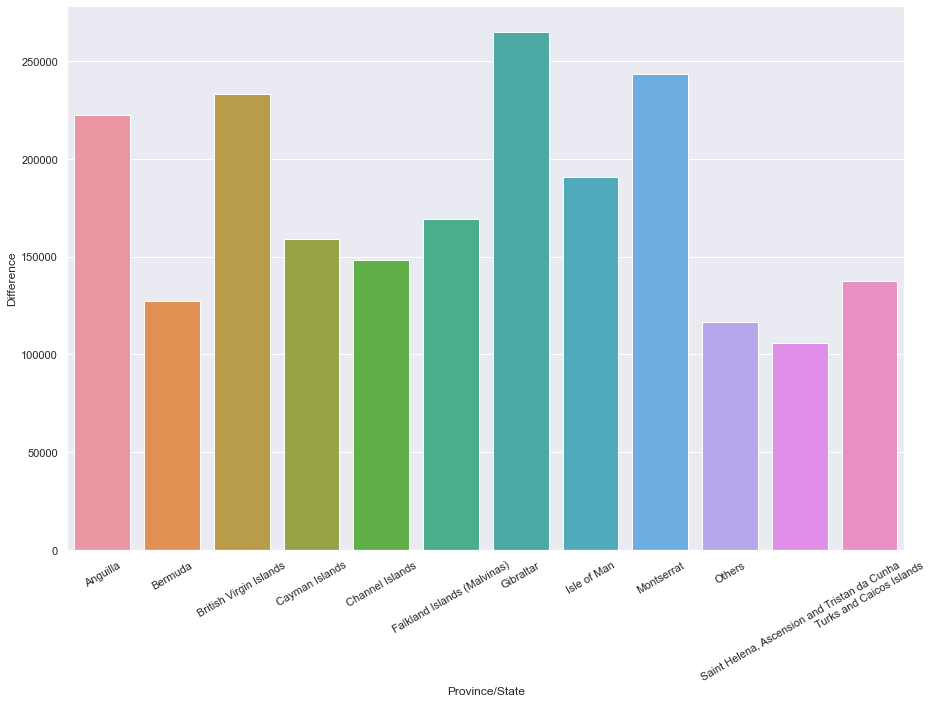

In [28]:
#barplot to look at first dose/second dose differences
barplot = sns.barplot(x='Province/State',y='Difference',data=cov_vac_subset)
plt.figure=(15,8) #adjusting figure size
barplot.set_xticklabels(barplot.get_xticklabels(),rotation = 30) #rotate labels as these were not visible due to overlap

In [52]:
#Groupby province/state
cov_vac_deaths = cov_vac.groupby("Date")[["Deaths"]].sum().reset_index()
cov_vac_deaths.head()

,Date,Deaths
0,2020-01-22,0.0
1,2020-01-23,0.0
2,2020-01-24,0.0
3,2020-01-25,0.0
4,2020-01-26,0.0


In [40]:
#cov_vac_deaths['death_date'] = cov_vac_deaths['Date']

In [36]:
#cov_vac_deaths['Deaths'] = cov_vac_deaths['Deaths'].astype(int)
import pandas as pd
import numpy as np
import seaborn as sns

In [37]:
#cov_vac_deaths.set_index('death_date', inplace=True)
cov_vac_deaths['Date'] = pd.to_datetime(cov_vac_deaths['Date'])
cov_vac_deaths.set_index('Date',inplace=True)

<AxesSubplot:ylabel='Deaths'>

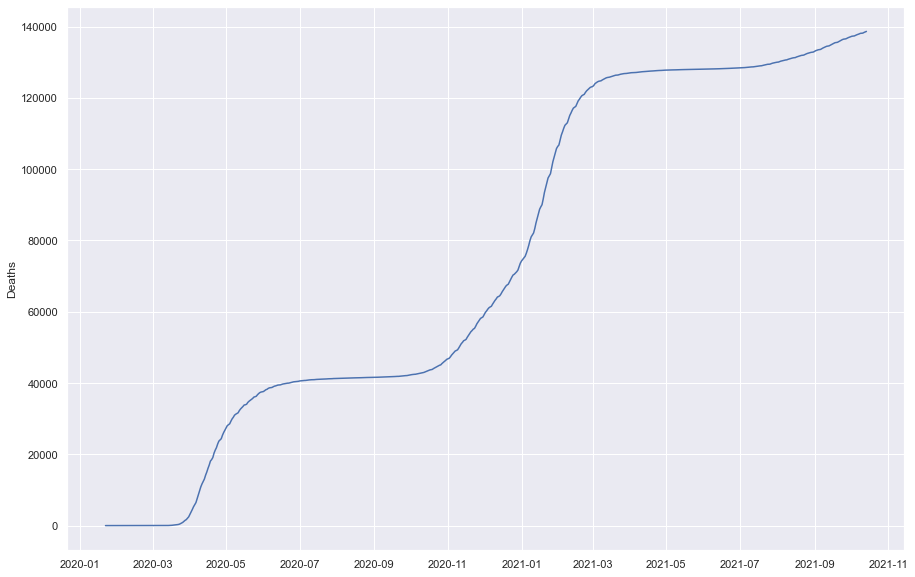

In [38]:
sns.lineplot(x=cov_vac_deaths.index.values,y='Deaths',data=cov_vac_deaths)

In [75]:
#excluse others from analysis
cov_vac_finalset = cov_vac[cov_vac['Province/State'] != 'Others']
cov_vac_finalset # to check others was excluded

,Province/State,Country/Region_x,Lat_x,Long_x,ISO 3166-1 Alpha 3-Codes_x,Sub-region Name_x,Intermediate Region Code_x,Date,Deaths,Cases,...,Hospitalised,Country/Region_y,Lat_y,Long_y,ISO 3166-1 Alpha 3-Codes_y,Sub-region Name_y,Intermediate Region Code_y,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
1,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
2,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
3,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
4,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
5,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-27,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
6,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-28,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
7,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-29,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
8,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-30,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0
9,Anguilla,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,2020-01-31,0.0,0.0,...,0.0,United Kingdom,18.220600,-63.068600,AIA,Latin America and the Caribbean,29,0,0,0


In [71]:
#re-run the grouping and aggregation with others excluded
cov_vac_V2 = cov_vac_finalset.groupby("Date")[["Deaths"]].sum().reset_index()

In [77]:
cov_vac_V2.head() #check table top

,Date,Deaths
0,2020-01-22,0.0
1,2020-01-23,0.0
2,2020-01-24,0.0
3,2020-01-25,0.0
4,2020-01-26,0.0


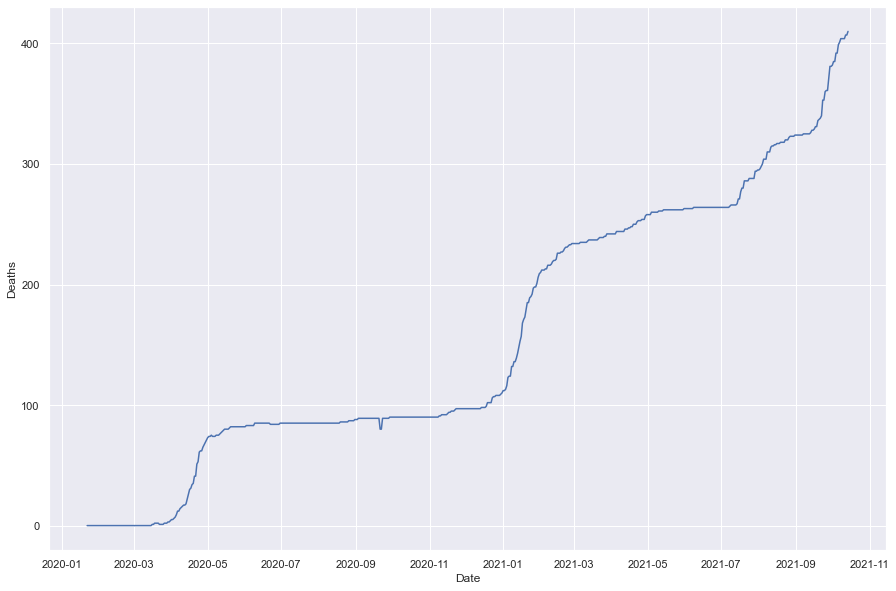

In [82]:
graph = sns.lineplot(x='Date',y='Deaths',data=cov_vac_V2) #plot the line graph

In [96]:
#convert date so in months
cov_vac_V3['Month']=pd.to_datetime(cov_vac_finalset['Date'])+pd.offsets.MonthBegin(0)

In [104]:
#redraw line growth with date changed to month
cov_vac_V4 = cov_vac_V3.groupby("Date")[["Deaths"]].sum().reset_index()
cov_vac_V4['Month']=pd.to_datetime(cov_vac_finalset['Date'])+pd.offsets.MonthBegin(0)
cov_vac_V4

,Date,Deaths,Month
0,2020-01-22,0.0,2020-02-01
1,2020-01-23,0.0,2020-02-01
2,2020-01-24,0.0,2020-02-01
3,2020-01-25,0.0,2020-02-01
4,2020-01-26,0.0,2020-02-01
5,2020-01-27,0.0,2020-02-01
6,2020-01-28,0.0,2020-02-01
7,2020-01-29,0.0,2020-02-01
8,2020-01-30,0.0,2020-02-01
9,2020-01-31,0.0,2020-02-01


***Notes and observations:***
Your observations here. (Double click to edit)

***Examples could include:***
- Are there other trends in terms of recoveries or hospitalisations compared to other features that you found interesting and that may add value in terms of the decision making process?
- Any other observations regarding the data?
- Any suggestions for improvements and further analysis?
- What would your future data requirements be?

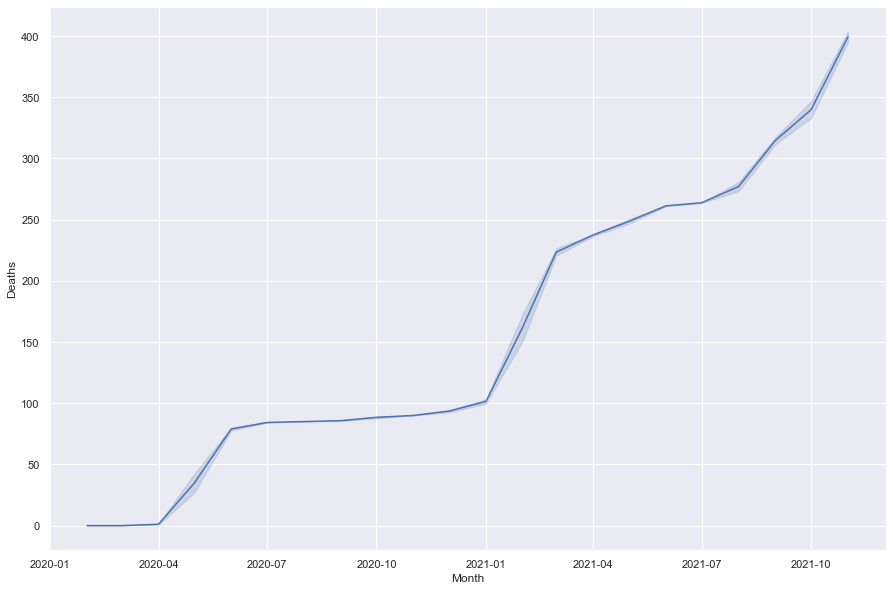

In [105]:
graph = sns.lineplot(x='Month',y='Deaths',data=cov_vac_V4)

In [31]:
#sort data by Province/State and patients recovered
cov_vac_rec = cov_vac_subset.groupby("Province/State")[["Recovered"]].max()
cov_vac_rec

,Recovered
Province/State,
Anguilla,111.0
Bermuda,2503.0
British Virgin Islands,1914.0
Cayman Islands,635.0
Channel Islands,8322.0
Falkland Islands (Malvinas),63.0
Gibraltar,4670.0
Isle of Man,4019.0
Montserrat,19.0


In [32]:
#sort patients recovered in ascending order
cov_vac_rec.sort_values(by=['Recovered'],inplace=True)
cov_vac_rec

,Recovered
Province/State,
"Saint Helena, Ascension and Tristan da Cunha",4.0
Montserrat,19.0
Falkland Islands (Malvinas),63.0
Anguilla,111.0
Others,344.0
Cayman Islands,635.0
British Virgin Islands,1914.0
Turks and Caicos Islands,2433.0
Bermuda,2503.0


In [65]:
#sort by date and reocvered
cov_vac_rec_dte = cov_vac_subset.groupby("Date")[["Recovered"]].sum().reset_index()
cov_vac_rec_dte

,Date,Recovered
0,2020-01-22,0.0
1,2020-01-23,0.0
2,2020-01-24,0.0
3,2020-01-25,0.0
4,2020-01-26,0.0
5,2020-01-27,0.0
6,2020-01-28,0.0
7,2020-01-29,0.0
8,2020-01-30,0.0
9,2020-01-31,0.0


In [66]:
#change date to months
cov_vac_rec_dte['Month']=pd.to_datetime(cov_vac_rec_dte['Date'])+pd.offsets.MonthBegin(0)
cov_vac_rec_dte

,Date,Recovered,Month
0,2020-01-22,0.0,2020-02-01
1,2020-01-23,0.0,2020-02-01
2,2020-01-24,0.0,2020-02-01
3,2020-01-25,0.0,2020-02-01
4,2020-01-26,0.0,2020-02-01
5,2020-01-27,0.0,2020-02-01
6,2020-01-28,0.0,2020-02-01
7,2020-01-29,0.0,2020-02-01
8,2020-01-30,0.0,2020-02-01
9,2020-01-31,0.0,2020-02-01


In [67]:
#had the issue with not plotting so utilised text to set the index as month
cov_vac_rec_dte['Month'] = pd.to_datetime(cov_vac_rec_dte['Month'])
cov_vac_rec_dte.set_index('Month',inplace=True)

In [68]:
import seaborn as sns

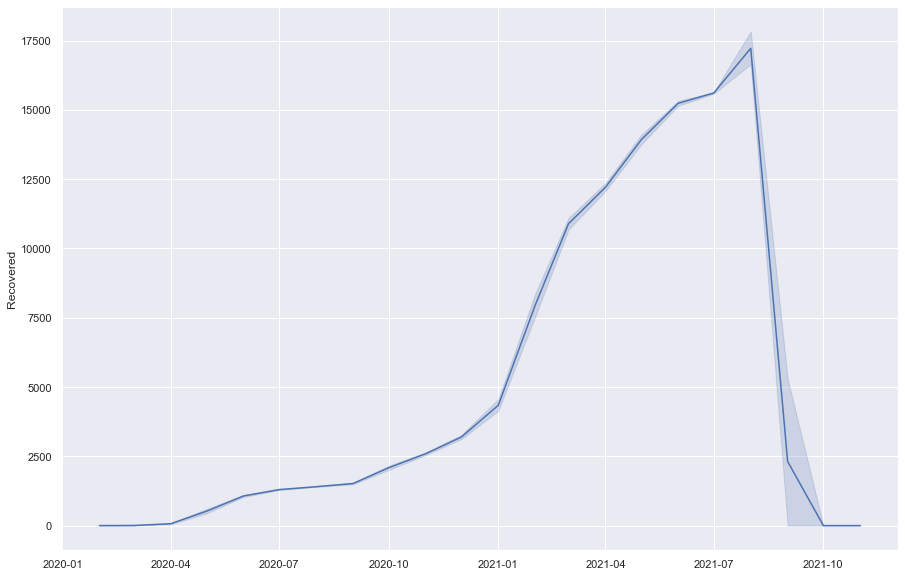

In [75]:
lp = sns.lineplot(x=cov_vac_rec_dte.index.values,y='Recovered',data=cov_vac_rec_date)

## 5) Assignment activity 5: External data 
In the next section, you were supplied with a sample file and the question was asked to determine whether there are additional `#tags` or keywords that could potentially provide insights into your COVID-19 analysis. While the sample set is limited, you were asked to review the provided file and demonstrate the typical steps and make recommendations regarding future use of similar data sets to provide richer insights.

### 5.1) Report expectations:
- Demonstrate basic ability to work with Twitter data.
- Search for hash-tags or keywords.
- Create DataFrames and visualisations.
- Note your observations.

In [72]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [73]:
# Import the tweet data set
tweets = pd.read_csv('tweets.csv')
tweets.head()

,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
0,23/05/2022,1.528750e+18,1.528750e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
1,23/05/2022,1.528720e+18,1.528720e+18,#COVID19 is linked to more #diabetes diagnoses...,False,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
2,23/05/2022,1.528650e+18,1.528650e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3,23/05/2022,1.528610e+18,1.528610e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
4,23/05/2022,1.528600e+18,1.528600e+18,Advanced healthcare at your fingertips\nhttps:...,False,"<a href=""https://about.twitter.com/products/tw...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN


In [74]:
# Explore the data: info(), head()
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3960 entries, 0 to 3959
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   created_at                 3959 non-null   object 
 1   id                         3959 non-null   float64
 2   id_str                     3959 non-null   float64
 3   text                       3959 non-null   object 
 4   truncated                  3959 non-null   object 
 5   source                     3959 non-null   object 
 6   in_reply_to_status_id      0 non-null      float64
 7   in_reply_to_status_id_str  0 non-null      float64
 8   in_reply_to_user_id        0 non-null      float64
 9   in_reply_to_user_id_str    0 non-null      float64
 10  in_reply_to_screen_name    0 non-null      float64
 11  contributors               0 non-null      float64
 12  is_quote_status            3959 non-null   object 
 13  retweet_count              3960 non-null   int64

In [88]:
tweets.retweet_count.value_counts()

3.057500e+18    630
3.057520e+18    293
3.057480e+18    224
3.057460e+18    211
3.054580e+18     38
3.054660e+18     28
3.054540e+18     27
3.055160e+18     26
3.054560e+18     24
3.057300e+18     23
3.054520e+18     23
3.054620e+18     22
3.055040e+18     22
3.056220e+18     22
3.054480e+18     21
3.057380e+18     21
3.057440e+18     20
3.055340e+18     20
3.054460e+18     19
3.056140e+18     19
3.055060e+18     18
3.055980e+18     18
3.055260e+18     18
3.055820e+18     18
3.055300e+18     18
3.054300e+18     18
3.054700e+18     18
3.054600e+18     18
3.055280e+18     17
3.054420e+18     17
3.054500e+18     17
3.055360e+18     17
3.055200e+18     17
3.057400e+18     16
3.052380e+18     16
3.057240e+18     16
3.056960e+18     16
3.056040e+18     16
3.055400e+18     16
3.055840e+18     16
3.055960e+18     16
3.056000e+18     16
3.056020e+18     16
3.054680e+18     16
3.055860e+18     16
3.057320e+18     15
3.056060e+18     15
3.056580e+18     15
3.055240e+18     15
3.054380e+18     15


In [89]:
tweets.favorite_count.value_counts()

0       2240
1        682
2        252
3        174
4        100
5         75
6         51
7         39
8         38
9         24
10        22
11        16
13        15
12        13
17        12
14        12
24        11
15        11
18         8
16         8
25         7
19         7
22         6
29         5
20         5
23         5
21         5
30         4
39         3
31         3
26         3
40         3
53         3
242        2
27         2
81         2
32         2
47         2
48         2
45         2
89         2
43         2
70         2
33         2
185        2
28         2
65         2
181        1
57         1
71         1
293        1
145        1
621        1
837        1
80         1
149        1
909        1
2251       1
44         1
4376       1
1003       1
66         1
140        1
264        1
72         1
3496       1
649        1
766        1
722        1
79         1
317        1
228        1
85         1
169        1
183        1
147        1
582        1

In [93]:
#create a new dataframe containing only text
tweets['text'] = tweets['text'].astype(str)
tweets_text = tweets['text'].apply(lambda x: x if x.strip() != None else None)

In [97]:
# Loop through the messages and build a list of values containing the #-symbol
tags = []
for y in (x.split(' ') for x in tweets_text.values):
    for z in y:
        if '#' in z:
            tags.append(z)
tags=pd.Series(tags).value_counts()
tags.head(30)

#COVID19                1632
#CovidIsNotOver          472
#China                   262
#covid19                 176
#Covid19                 148
#COVID                   108
#covid                   104
#Greece                  103
#coronavirus             100
#PeoplesVaccine.          84
#CoronaUpdate             84
#Omicron                  83
#COVID2020                82
#covid19uk                80
#CoronavirusOutbreak      80
#COVID19Pandemic          80
#monkeypox                77
#globalhealth             76
#publichealth             72
#healthtech               69
#COVID2019                69
#datascience              66
#data                     66
#analytics                64
#Shanghai                 63
#Covid_19                 63
#datavisualization        63
#pandemic                 60
#Athens                   55
#Beijing                  50
dtype: int64

In [99]:
#convert the series to a dataframe for next steps around visualisation
data = pd.DataFrame(tags).reset_index()
#rename columns
data.columns = ('word','count')
#fix count datatype
data['count'] = data['count'].astype(int)
data.head()

,word,count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148


In [102]:
#display records where the count if > 100
display(data.loc[(data['count']>100)])

,word,count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103


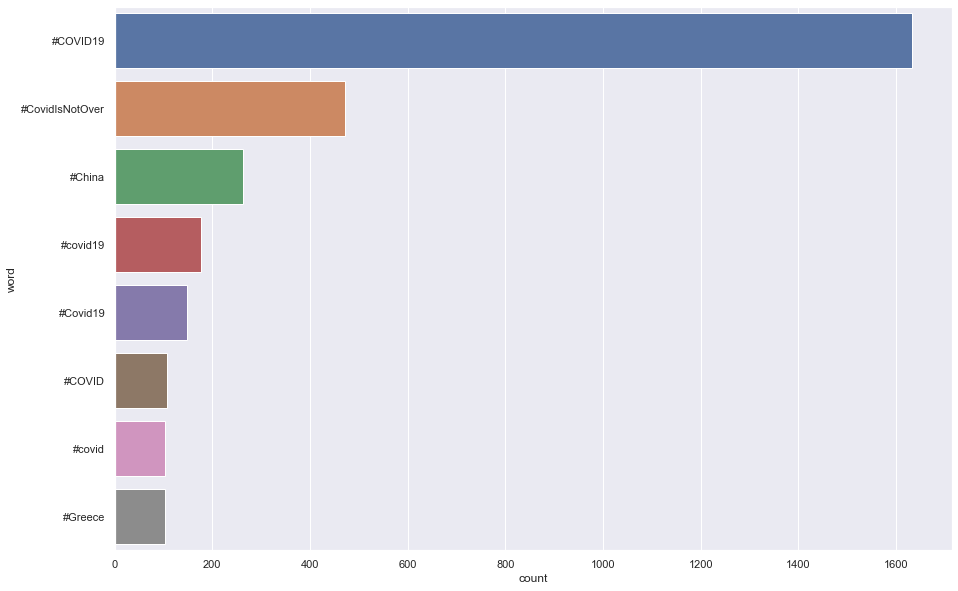

In [103]:
#plot the data
ax = sns.barplot(x='count',y='word',data=data.loc[(data['count']>100)])


### 5.2) Presentation expectations:
Discuss whether external data could potentially be used and whether it is a viable solution to pursue. Discuss your assumptions and suggestions. 

Points to consider:
- What insights can be gained from the data?
- What are the advantages and disadvantages of using external data?
- How would you suggest using external data in the project?

## 6) Assignment activity 6: 

### 6.1) Report expectations:
- Demonstrate using external function and interpret results.
- Note observations.

In [ ]:
# You can copy and paste the relevant code cells from the provided template here.

### 6.2) Presentation expectations:
- **Question 1**: We have heard of both qualitative and quantitative data from the previous consultant. What are the differences between the two? Should we use only one or both of these types of data and why? How can these be used in business predictions? Could you provide examples of each?
- **Question 2**: We have also heard a bit about the need for continuous improvement. Why should this be implemented, it seems like a waste of time. Why can’t we just implement the current project as it stands and move on to other pressing matters?
- **Question 3**: As a government, we adhere to all data protection requirements and have good governance in place. We only work with aggregated data and therefore will not expose any personal details. Have we covered everything from a data ethics standpoint? Is there anything else we need to implement from a data ethics perspective? 